## Part 1. Object Detector



We need an object detector to detect the object so we can use the position in object tracking. 

We use a pre-trained Yolov3 on MS coco to save time. You can select your own detector, just get the position.

### Preparation: install required modules

**Be sure to restart the runtime if instructed**



In [1]:
!pip3 install imageai
!pip3 install keras
!pip3 install tensorflow

     |████████████████████████████████| 160 kB 5.1 MB/s 
     |████████████████████████████████| 11.6 MB 49.5 MB/s 
     |████████████████████████████████| 2.1 MB 54.4 MB/s 
     |████████████████████████████████| 2.9 MB 52.9 MB/s 
     |████████████████████████████████| 14.9 MB 57.5 MB/s 
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20486 sha256=a6cd28f8924a9efbf337b823a0142275fb3623a63f091f9422f4594f5cd88a35
  Stored in directory: /root/.cache/pip/wheels/bd/ef/06/5d65f696360436c3a423020c4b7fd8c558c09ef264a0e6c575
Successfully built keras-resnet
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
 

     |████████████████████████████████| 462 kB 5.0 MB/s 
     |████████████████████████████████| 15.7 MB 65.3 MB/s 
     |████████████████████████████████| 1.4 MB 56.8 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.3
    Uninstalling numpy-1.19.3:
      Successfully uninstalled numpy-1.19.3
  Attempting uninstall: keras
    Found existing installation: Keras 2.4.3
    Uninstalling Keras-2.4.3:
      Successfully uninstalled Keras-2.4.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageai 2.1.6 requires keras==2.4.3, but you have keras 2.8.0 which is incompatible.
imageai 2.1.6 requires numpy==1.19.3, but you have numpy 1.21.6 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
bokeh 2.3.3 requires pillow>=7.1.0, but you have pillow 7.0.0 which is incompatible.
alb

### Download pretrained model

If all links below expired, please download the pre-trained model from imageai's official website: [https://imageai.readthedocs.io/en/latest/detection/index.html](https://imageai.readthedocs.io/en/latest/detection/index.html)

In [1]:
!wget https://dl.acytoo.com/yolo.h5 # if this site is down, use https://play.acytoo.com/yolo.h5 instead

--2022-04-23 06:15:26--  https://dl.acytoo.com/yolo.h5
Resolving dl.acytoo.com (dl.acytoo.com)... 129.158.55.57
Connecting to dl.acytoo.com (dl.acytoo.com)|129.158.55.57|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248686624 (237M) [application/x-hdf]
Saving to: ‘yolo.h5’

yolo.h5             100%[===================>] 237.17M   123MB/s    in 1.9s    

2022-04-23 06:15:28 (123 MB/s) - ‘yolo.h5’ saved [248686624/248686624]



Define a general detector model: yolov3, trained on ms coco dataset.

Yolo(You Only Look Once) is one stage concolutional neural network for peforming object detection in real time. Compared to two stage CNNs, Yolo is faster and consumes less computing resources, but it's precision is lower than, it's a Speed-Accuracy Trade-Off. 

Imageai is a python module that has many pre-trained object detection model. 


For detailed information about imageai, please refer to [https://imageai.readthedocs.io/en/latest/detection/index.html](https://imageai.readthedocs.io/en/latest/detection/index.html)

In [2]:
from imageai.Detection import ObjectDetection

detector = ObjectDetection()
detector.setModelTypeAsYOLOv3()

### Load pretrained model

In [3]:
detector.setModelPath("yolo.h5")
detector.loadModel()

### Define ball detector from general detector

Yolo trained on ms coco can detect more than 170 kinds of object, we only need ball here, so after perform yolo on the input image, we select the objects that detedted as ball.

Ball detector, input is image, return probility and location

In [4]:
def ball_detector(img, threshold=30):
  """ 
  :param img: image matrix
  :param threshold: min probability that one object is detected as ball
  :return: [probability], [location]
  """
  img_ori_dec, detections = detector.detectObjectsFromImage(input_image=img, input_type = "array",
                                                            output_type="array", minimum_percentage_probability=threshold)
  prob = []
  loc = []
  for item in detections:
    if item['name'] == 'sports ball':
      prob.append(item['percentage_probability'])
      loc.append(item['box_points'])
  return prob, loc


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2

### Download two videos

In [6]:
!wget https://dl.acytoo.com/ball.mp4
!wget https://dl.acytoo.com/multiObject.avi

--2022-04-23 06:16:01--  https://dl.acytoo.com/ball.mp4
Resolving dl.acytoo.com (dl.acytoo.com)... 129.158.55.57
Connecting to dl.acytoo.com (dl.acytoo.com)|129.158.55.57|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1368142 (1.3M) [video/mp4]
Saving to: ‘ball.mp4’

ball.mp4            100%[===================>]   1.30M  --.-KB/s    in 0.08s   

2022-04-23 06:16:01 (15.4 MB/s) - ‘ball.mp4’ saved [1368142/1368142]

--2022-04-23 06:16:01--  https://dl.acytoo.com/multiObject.avi
Resolving dl.acytoo.com (dl.acytoo.com)... 129.158.55.57
Connecting to dl.acytoo.com (dl.acytoo.com)|129.158.55.57|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1769608 (1.7M) [video/x-msvideo]
Saving to: ‘multiObject.avi’

multiObject.avi     100%[===================>]   1.69M  --.-KB/s    in 0.09s   

2022-04-23 06:16:01 (19.7 MB/s) - ‘multiObject.avi’ saved [1769608/1769608]



## Part 2: Tracking

### Get centroid of object

In above detector, our detector result is denoted as left top(x1, y1) and right bottom(x2, y2) vertexes, in order to apply kalman filter, we need to find the centroid of object(the ball). The centroid of ball can be calculated as
$$
x_c = x_1 + \frac{(x_2 - x_1)}{2}\\
y_c = y_2 + \frac{(y_1 - y_2)}{2}\\
$$



In [7]:
def get_centroid(loc):
  if loc is None:
    return None
  return int(loc[0] + (loc[2] - loc[0]) / 2), int(loc[3] + (loc[1] - loc[3]) / 2)

### Kalman filter

In [8]:
import numpy as np
from scipy.optimize import linear_sum_assignment # to assign detectors to objects 

In [9]:
class KalmanFilter():
  def __init__(self, dt=0.1, u_x=1, u_y=1,
               std_acc=1, x_std_meas=0.1, y_std_meas=0.1):
    """
    :param dt: sampling time (time for 1 cycle)
    :param u_x: acceleration in x-direction
    :param u_y: acceleration in y-direction
    :param std_acc: process noise magnitude
    :param x_std_meas: standard deviation of the measurement in x-direction
    :param y_std_meas: standard deviation of the measurement in y-direction
    """

    self.dt = dt                              # Define sampling time
    self.u = np.matrix([[u_x],[u_y]])         # Define the  control input variables
    self.x = np.matrix([[0], [0], [0], [0]])  # Initial State

    # Define the State Transition Matrix A
    self.A = np.matrix([[1, 0, self.dt, 0],
                        [0, 1, 0, self.dt],
                        [0, 0, 1, 0],
                        [0, 0, 0, 1]])

    # Define the Control Input Matrix B
    self.B = np.matrix([[(self.dt**2)/2, 0],
                        [0,(self.dt**2)/2],
                        [self.dt,0],
                        [0,self.dt]])

    # Define Measurement Mapping Matrix
    self.H = np.matrix([[1, 0, 0, 0],
                        [0, 1, 0, 0]])

    #Initial Process Noise Covariance
    self.Q = np.matrix([[(self.dt**4)/4, 0, (self.dt**3)/2, 0],
                        [0, (self.dt**4)/4, 0, (self.dt**3)/2],
                        [(self.dt**3)/2, 0, self.dt**2, 0],
                        [0, (self.dt**3)/2, 0, self.dt**2]]) * std_acc**2

    #Initial Measurement Noise Covariance
    self.R = np.matrix([[x_std_meas**2,0],
                       [0, y_std_meas**2]])

    #Initial Covariance Matrix
    self.P = np.eye(self.A.shape[1])

  def predict(self):
    """
    :return: numpy matrix
    """
    # Update time state
    self.x = np.dot(self.A, self.x) + np.dot(self.B, self.u)
    # Calculate error covariance
    self.P = np.dot(np.dot(self.A, self.P), self.A.T) + self.Q
    return self.x[0:2]

  def update(self, z):
    """
    :param z: np.array
    :return: numpy matrix
    """
    # S = H*P*H'+R
    S = np.dot(self.H, np.dot(self.P, self.H.T)) + self.R
    # Calculate the Kalman Gain
    # K = P * H'* inv(H*P*H'+R)
    K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))
    self.x = np.round(self.x + np.dot(K, (z - np.dot(self.H, self.x))))
    I = np.eye(self.H.shape[1])
    # Update error covariance matrix
    self.P = (I - (K * self.H)) * self.P
    return self.x[0:2]

Green square is measurement, and red dot is prediction

In [10]:
def predict_ball(src, dest):
  """
  :param src: source video for detection and predicton
  :param dest: output video after processing

  detection: gree square box
  prediction: red dot
  """
  COLOR_RED = (255, 0, 0)
  COLOR_GREEN = (0, 255, 0)

  ############################ init kalman filter ##############################
  kalman = KalmanFilter()
  # set first point, the first location is VERY important
  kalman.update(np.array([[906], [311]], dtype=np.float32))


  vid = cv2.VideoCapture(src)
  if not vid.isOpened():
    print("File open error, please download video")

  ############################ params for saving video #########################
  fps = int(vid.get(cv2.CAP_PROP_FPS))              # fps
  height = int(vid.get(cv2.CAP_PROP_FRAME_HEIGHT))  # height
  width = int(vid.get(cv2.CAP_PROP_FRAME_WIDTH))    # width
  size = (width, height)
  fourcc = cv2.VideoWriter_fourcc(*'MJPG')
  out = cv2.VideoWriter(dest, fourcc, fps, size)

  current_measurement = None
  current_prediction = (905, 311)

  while vid.isOpened():                             # read all video frames
    ret, frame = vid.read()
    if not ret:
      break

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # convert bgr to rgb
    _, loc = ball_detector(frame)

    lpx, lpy = int(current_prediction[0]), int(current_prediction[1])
    frame = cv2.circle(frame, (lpx, lpy), 0, COLOR_RED, 20) # plot prediction dot

    if len(loc) > 0: # detection -> draw bounding box, update kalman filter
      frame = cv2.rectangle(frame, (loc[0][0], loc[0][1]), (loc[0][2], loc[0][3]), COLOR_GREEN, 2)
      # update kalman
      current_measurement = np.array(get_centroid(loc[0]), dtype=np.float32).reshape(2, 1)
      kalman.update(current_measurement)

    (x, y) = kalman.predict()
    current_prediction = (int(x), int(y))

    plt.imshow(frame, interpolation='nearest')
    plt.show()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    out.write(frame)

  vid.release() # release video object
  out.release()

processing sin


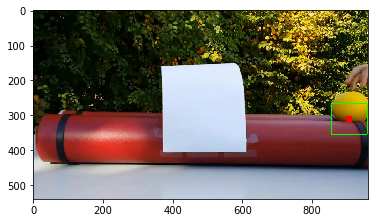

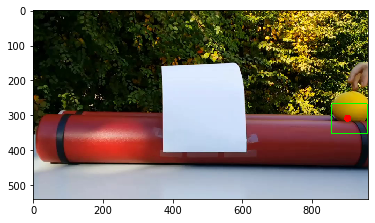

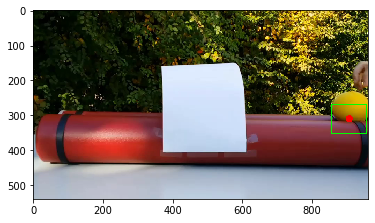

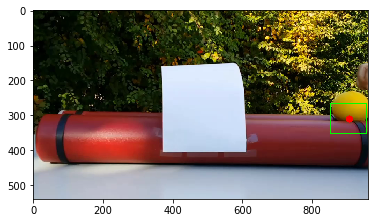

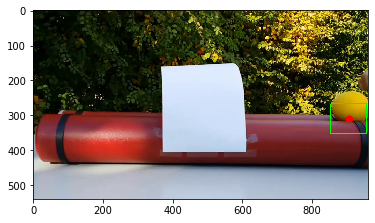

...

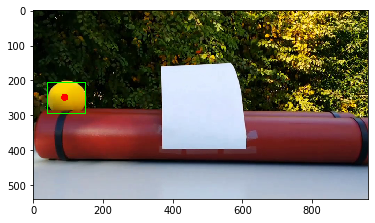

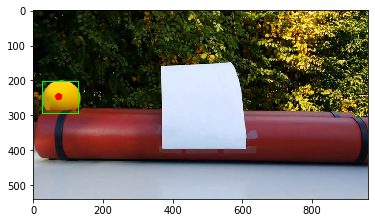

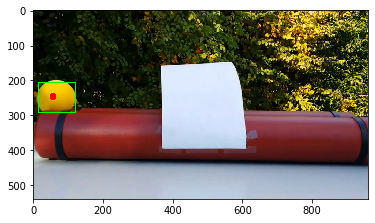

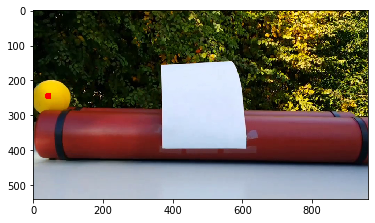

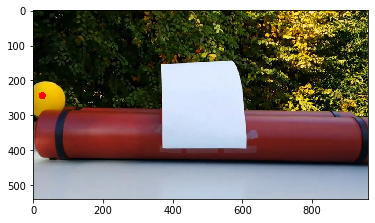

In [11]:
sin = 'ball.mp4'
sin_out = 'sin_track.avi'
print("processing sin")
predict_ball(sin, sin_out)

#### single object tracking

Converted gif

![](https://cdn.jsdelivr.net/gh/acytxx/a18f3c90988@dev/acytoo_sin_track.gif)

### Multiple object tracking

Multiple object tracking(MOT) is much more difficult than single object tracking, what if the two objects crossing each other? What if two objects collide and bound the other direction? What if a new object just show up and another disappear?

We can use a data structure to store all the information about one object, let's call this data structure tracker. The number of tracker is one more than the number of object, when one object disappear for some consecutive frames, delete one tracker, a new objest shows up, add one tracker. To match trackers to objects, we use a loss function, calculate the error between detection and prediction.

> The linear sum assignment problem is also known as minimum weight matching in bipartite graphs. A problem instance is described by a matrix C, where each C[i,j] is the cost of matching vertex i of the first partite set (a “worker”) and vertex j of the second set (a “job”). The goal is to find a complete assignment of workers to jobs of minimal cost.

Details of the method used here to assign tracker to object:
[https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.linear_sum_assignment.html](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.linear_sum_assignment.html)

In [12]:
from dataclasses import dataclass

@dataclass
class Tracker:
  id: int
  centroid: tuple
  kalman: KalmanFilter()
  consecutive_invi_num = 0

Loss: Euclidean distance

In [13]:
def distance(predict, centroid):
  """
  Params: np.array
  Return: float
  Euclidean distance
  """
  return np.linalg.norm(predict - centroid)

In [14]:
cost_of_non_assigned = 500
def assign_tracks(costs):
  row_ind, col_ind = linear_sum_assignment(costs)
  return row_ind, col_ind

In [15]:
def predict_multiple_ball(src, dest):
  """
  src: source video for detection and predicton
  dest: output video after processing

  detection: gree square box
  prediction: red dot
  """
  colors_dot = [(0, 255, 0), (255, 0, 0), (255, 255, 0), (0, 0, 255)] # different color for different object


  vid = cv2.VideoCapture(src)
  if not vid.isOpened():
    print("File open error, please download video")

  ############################ params for saving video #########################
  fps = int(vid.get(cv2.CAP_PROP_FPS))              # fps
  height = int(vid.get(cv2.CAP_PROP_FRAME_HEIGHT))  # height
  width = int(vid.get(cv2.CAP_PROP_FRAME_WIDTH))    # width
  size = (width, height)
  fourcc = cv2.VideoWriter_fourcc(*'MJPG')
  out = cv2.VideoWriter(dest, fourcc, fps, size)
  font = cv2.FONT_HERSHEY_SIMPLEX

  trackers = []
  tracker = Tracker(id=0, centroid=(621, 172), kalman=KalmanFilter(u_x=-0.5, u_y=0))
  tmp = np.array(tracker.centroid, dtype=np.float32).reshape(2, 1)
  tracker.kalman.update(tmp)

  trackers.append(tracker)


  while vid.isOpened(): # read all video frames
    # read frame, convert to rgb
    ret, frame = vid.read()
    if not ret:
      break
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) # convert bgr to rgb

    # detect the object in image
    _, loc = ball_detector(frame) # return ([probs], [locs])
    detection_num = len(loc)
    cens = []

    for l in loc:
      # frame = cv2.rectangle(frame, (l[0], l[1]), (l[2], l[3]), colors_box[1], 2) # show detector box
      cens.append(get_centroid(l))                # get centroid of all detection


    # If not enough tracker, add new tracker for new object
    if detection_num > len(trackers):
      tracker = Tracker(id=1, centroid=(27, 149), kalman=KalmanFilter(u_x=0.5, u_y=0)) # the initial location is VERY important
      tracker.kalman.update(np.array(tracker.centroid, dtype=np.float32).reshape(2, 1))
      trackers.append(tracker)

    # predict new location for all existing tracker
    for tracker in trackers:
      (cx, cy) = tracker.kalman.predict()
      tracker.centroid = (int(cx), int(cy))

    # Tracker management
    # calculate lose
    costs = []
    for tracker in trackers:
      current_costs = []
      for c in cens:
        cen = np.array(c, dtype=np.float32)
        current_costs.append(distance(tracker.centroid, cen)) # prediction and detection
      costs.append(current_costs)

    # assign tracker to object, update kalman filter, set invisible number to 0
    tracker_id, obj_id = assign_tracks(np.array(costs, dtype=np.float32))
    # obj_id = np.flip(obj_id)
    for tid, oid in zip(tracker_id, obj_id):
      measure_cen = np.array(cens[oid]).reshape(2, 1)
      trackers[tid].kalman.update(measure_cen)
      # print('predict', trackers[tid].centroid)
      # print('detected', cens[oid])

    # show prediction
    for tracker in trackers:
      cx = int(tracker.centroid[0])
      cy = int(tracker.centroid[1])
      frame = cv2.circle(frame, (cx, cy), 0, colors_dot[tracker.id], 20)
      frame = cv2.putText(frame, f'{tracker.id}', (cx, cy - 15), font, 1, colors_dot[tracker.id], 2)

    plt.imshow(frame, interpolation='nearest')
    plt.show()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    out.write(frame)

  vid.release() # release video object
  out.release()

processing mul


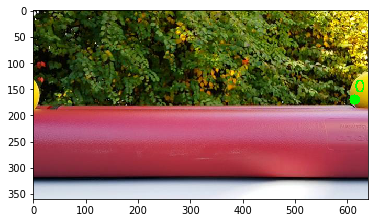

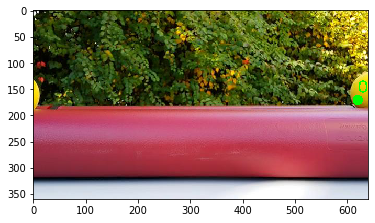

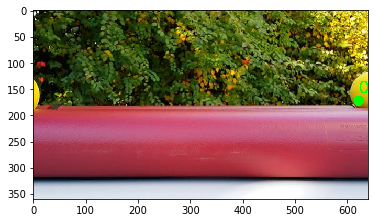

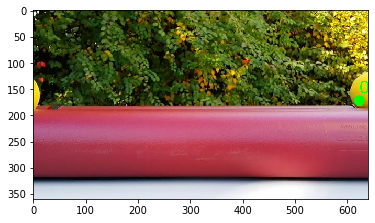

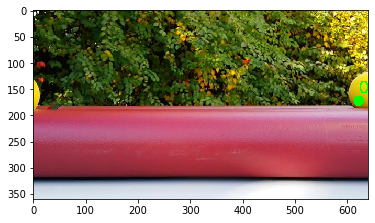

...

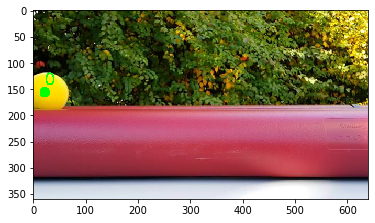

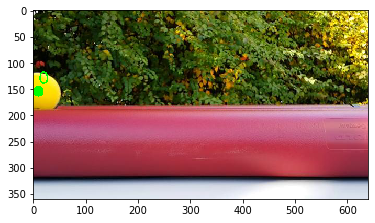

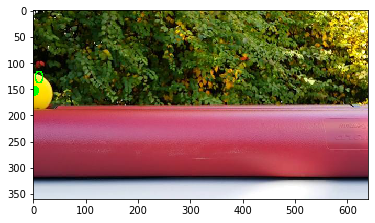

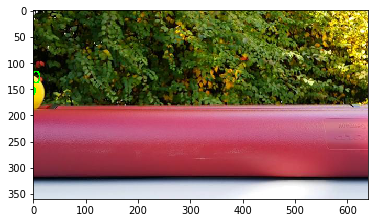

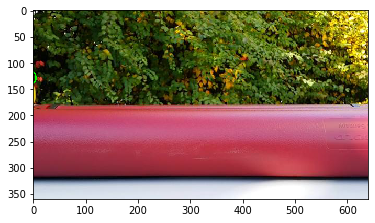

In [16]:
mul = 'multiObject.avi'
mul_out = 'mul_track.avi'
print("processing mul")
predict_multiple_ball(mul, mul_out)

#### multiple object tracking

Converted gif

![](https://cdn.jsdelivr.net/gh/acytxx/a18f3c90988@dev/acytoo_mul_track.gif)